In [1]:
import pandas as pd

import plotly
import plotly.figure_factory as ff
import plotly.graph_objects as go
import plotly.express as px
import dash_bio as dashbio

In [2]:
anjidf = pd.read_csv(r'C:\Users\ben\COVID-19_Multi-Omics\data\interim\EAT\COVID_proteomics_Heatmap_COVIDrelativeNONCOVIDmedian.csv', sep=",", index_col=0)
anjidf

,COVID_49,COVID_99,COVID_27,COVID_77,COVID_55,COVID_46,COVID_38,COVID_71,COVID_08,COVID_57,...,COVID_80,COVID_75,COVID_98,COVID_102,COVID_84,COVID_52,COVID_74,COVID_41,COVID_02,COVID_87
P24821-4,4.138617,9.394954,2.126676,3.212577,-0.128531,-1.911568,-1.376005,-0.928474,-0.773813,1.793737,...,4.540277,4.684489,6.400454,7.902899,6.065889,-2.878133,6.976529,6.712197,5.665361,6.510758
Q71DI3,7.317308,-0.102282,-1.738060,8.145028,7.593072,5.617665,-0.368182,-0.204161,-2.719114,-2.805416,...,0.082893,0.675673,-0.859535,-2.865811,-0.063508,-1.556571,3.949446,3.262460,4.318808,0.144460
Q99497,5.719916,8.552794,-0.425357,6.312970,5.226545,5.686718,5.346991,4.823572,6.129522,0.224950,...,0.604432,-2.229337,-1.520658,-2.990216,-0.869824,-0.493663,3.711249,-1.557202,-2.503541,-4.541536
P01877,7.088971,-1.847865,-4.129268,-3.769222,-2.940619,-3.763935,6.674672,-4.380907,-1.504955,-5.945127,...,-0.924530,-2.883341,-0.617794,-2.710542,-3.657562,4.319200,6.599778,9.655296,-5.103174,-5.332592
O75874,7.589175,9.627468,5.865765,2.124866,5.288964,-1.461987,2.590633,0.256543,5.797214,-1.742238,...,5.452348,6.249416,-0.673945,-0.297914,-0.772429,-0.421890,-1.930120,-2.224013,2.015192,5.052717
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
A0A0J9YY99,3.146877,-1.565208,-3.687992,0.647593,-1.686238,-2.404075,2.017263,-1.835490,-1.447346,-1.293630,...,-1.322478,2.274981,-1.362063,0.444852,-1.888745,1.404943,3.189056,1.917198,-2.125471,-1.910558
P0DP08,3.401023,1.076531,-1.282414,-0.937911,-2.798433,0.898746,2.833960,-0.605110,-2.305410,-3.299876,...,-3.998315,-2.710407,-0.249995,-0.105833,-4.144029,-2.079024,-1.539466,2.328244,1.468709,0.914028
A0A0B4J2H0,-1.168045,-0.121272,-0.207637,-1.087051,-3.525862,-1.353194,1.207187,-1.181829,-0.546572,-1.033159,...,-0.009726,-4.354265,0.212192,1.826374,1.285321,0.026809,1.863400,1.495718,2.619678,1.959348
H7BXV5,-0.104889,0.703783,1.878985,-2.028187,-5.358854,0.429967,1.084992,-0.024995,1.515090,2.184642,...,1.720444,2.198739,2.318083,-1.113954,1.659772,2.114996,0.233222,2.071413,-0.694702,1.892127


In [46]:
# Clustergram class source code: https://github.com/plotly/dash-bio/blob/320d91fe06959bcbcc56215d4a3b144171330e0a/dash_bio/component_factory/_clustergram.py

fig = dashbio.Clustergram(
    anjidf,
    column_labels=anjidf.columns.tolist(),
    row_labels=anjidf.index.tolist(),
    color_map=[[0.0, '#3C99B2'], [0.5, 'white'], [1.0, '#EF2D00']],
    display_ratio=[0.2,0.1],  # Ratio of dendrogram width to heatmap width, [row, col]    
    col_group_marker=[
      {'group': 0,                         # the dendrogram cluster number to highlight
       'annotation': 'my column cluster',  # annotation text
       'color': '#EF553B'}                      
                      ],
    row_group_marker=[
      {'group': 0,                        
       'annotation': 'my row cluster',  
       'color': '#EF553B'}                      
                      ],
#     hidden_labels=['row', 'col'],
    )               

                          

        # TODO: Hovering over heatmap point should also show the patient metadata (e.g. mech ventilation, ICU status)
        
        # TODO: checkbox that switches math to median vs mean for log2foldchange 
fig.update_layout(width=1000, height=1000,
                  font=dict(family="Helvetica",
                            size=10,
                            color="#7f7f7f"))
fig.update_traces(hovertemplate='Feature: %{y} <br>Patient id: %{x}',
                  name='',  # removes the "trace 2" text on hover over heatmap, and other text from dendrogram on hover
                  selector=None)

fig.update_xaxes(showticklabels=False)
fig.update_yaxes(showticklabels=False)


# What all the axes do:
# xaxis:  unknown
# xaxis2: heatmap width while being centered in middle of plot
# xaxis3: unknown
# xaxis4: dendrogram width 
# xaxis5: heatmap width, from left side, without centering. Note that heatmap width can never overlap the colored legend
# xaxis6: moves xaxis location of the row group label
# xaxis7: unknown
# xaxis8: unknown
# xaxis9: unknown
# yaxis:  unknown
# yaxis2: dendrogram height
# yaxis3: unknown
# yaxis4: heatmap height centered to middle
# yaxis5: heatmap height also, but different behavior when changing 'domain' key in the yaxis5 dictionary
# yaxis6: unknown
# yaxis7: unknown
# yaxis8: moves yaxis location of the column group label
# yaxis9: unknown

# notes on other axes: 
# from: https://github.com/plotly/dash-bio/blob/master/dash_bio/component_factory/_clustergram.py
    # axis settings for subplots that will display group labels
    # axes = ["xaxis6", "yaxis6", "xaxis8", "yaxis8"]



# fig.update_layout(yaxis5={'domain':[0.0, 0.99]})
# fig.update_layout(yaxis2={'domain': [0.0, fig['layout']['yaxis5']['domain'][1]]})
# fig.update_layout(yaxis8={'domain':[0.99, 0.8]})

# Makes the dendrogram touch the heatmap
fig.update_layout(yaxis2={'domain': [fig['layout']['yaxis5']['domain'][1]-0.1, 1]})
# domain of yaxis2 (the vertical range of the column dendrogram) goes from [the domain start of the heatmap - 0.1, 1]


fig.show()

print(fig)
# fig.update_traces(mode="markers+lines", hovertemplate=None)
# fig.update_xaxes(tickangle=180)
# fig.update_yaxes(tickangle=-180)



Figure({
    'data': [{'hoverinfo': 'y+name',
              'line': {'width': 0.5},
              'marker': {'color': 'rgb(0,0,0)'},
              'mode': 'lines',
              'name': 'Col Cluster 0',
              'type': 'scatter',
              'x': array([  5.     ,   5.     ,  15.     , ..., 378.28125, 378.28125,       nan]),
              'xaxis': 'x2',
              'y': array([ 0.        , 45.64296123, 45.64296123, ..., 80.04111924, 64.09054074,
                                  nan]),
              'yaxis': 'y2'},
             {'hoverinfo': 'x+name',
              'line': {'width': 0.5},
              'marker': {'color': 'rgb(0,0,0)'},
              'mode': 'lines',
              'name': 'Row Cluster 0',
              'type': 'scatter',
              'x': array([ 0.        , 37.69491276, 37.69491276, ..., 87.39031762, 67.44123728,
                                  nan]),
              'xaxis': 'x4',
              'y': array([  15.        ,   15.        ,   25.        , ..., 

In [3]:
# from src/db_queries/db_queries.py

from sqlalchemy import create_engine, MetaData, Table, select, join
import pandas as pd

db_path = 'sqlite:///../../data/SQLite Database/20200525/Covid-19 Study DB.sqlite'

def get_omics_data(with_metadata=False, dataset="proteomics"):

    omics_id_dict = {
        "proteomics":1,
        "lipidomics":2,
        "metabolomics":3,
        "transcriptomics":4
    }

    omics_id = omics_id_dict[dataset]

    # Create an engine that connects to the Covid-19 Study DB.sqlite file: engine
    engine = create_engine(db_path)

    # Establish connection
    connection = engine.connect()

    # pull table into df
    query = "SELECT * from {}_measurements".format(dataset)
    omics_measurements_df = pd.read_sql_query(query, connection)

    # pull table into df
    query = "SELECT * from {}_runs".format(dataset)
    omics_runs_df = pd.read_sql_query(query, connection)

    # pull table into df
    query = "SELECT * from rawfiles WHERE ome_id={} AND sample_ID<>-1 and keep=1".format(omics_id)
    rawfiles_df = pd.read_sql_query(query, connection)

    # pull table into df
    deidentified_patient_metadata_df = pd.read_sql_query("SELECT * from deidentified_patient_metadata", connection)

    # make sure the merge by columns are all the same type -> pandas seems sensitive to this
    omics_measurements_df = omics_measurements_df.astype({'replicate_id': 'int32'})
    omics_runs_df = omics_runs_df.astype({'replicate_id': 'int32', 'rawfile_id': 'int32'})
    rawfiles_df = rawfiles_df.astype({'rawfile_id': 'int32', 'sample_id': 'int32'})
    deidentified_patient_metadata_df = deidentified_patient_metadata_df.astype({'sample_id': 'int32'})

    joined_df = omics_measurements_df\
                .join(omics_runs_df.set_index('replicate_id'), on='replicate_id')\
                .join(rawfiles_df.set_index('rawfile_id'), on='rawfile_id')\
                .join(deidentified_patient_metadata_df.set_index('sample_id'), on='sample_id')
    

    # drop samples that are missing COVID or ICU status
    joined_df.dropna(subset=['ICU_1','COVID'], inplace=True)
    
    # pivot to wide format
    wide_df = joined_df.pivot_table(index='sample_id', columns='biomolecule_id', values='normalized_abundance')
    wide_df.columns = [str(col) for col in wide_df.columns]

    query = "SELECT * from biomolecules WHERE omics_id={}".format(omics_id)
    # get biomolecule names
    biomolecules_df = pd.read_sql_query(query, connection)

    # close DB connection
    connection.close()

    # build biomolecule name dict and drop list
    biomolecule_name_dict = {}
    biomolecule_drop_list = []
    for index, row in biomolecules_df.iterrows():
        biomolecule_id = str(row['biomolecule_id'])
        standardized_name = row['standardized_name']
        biomolecule_name_dict[biomolecule_id] = standardized_name

        keep = row['keep']
        if keep!="1":
            biomolecule_drop_list.append(biomolecule_id)

    # drop biomolecules
    wide_df.drop(biomolecule_drop_list, axis=1, inplace=True)

    # replace wide_df column names
    new_col_names = []
    for col in wide_df.columns:
        new_col_names.append(biomolecule_name_dict[str(col)])
    wide_df.columns = new_col_names

    # record quant value range
    quant_value_range = wide_df.shape[1]

    # optional return matrix with clinical metadata
    if with_metadata:

        combined_df = wide_df.join(deidentified_patient_metadata_df.set_index('sample_id'), on='sample_id')#.dropna()
        return combined_df, quant_value_range
    
    wide_df.index = wide_df.index.astype(int)  # patient ID number should be int, not float. Could also be str.

    return wide_df, quant_value_range

In [4]:
df, val_range = get_omics_data()

In [5]:
df

,A0A024R6I7;A0A0G2JRN3,A0A075B6H9,A0A075B6I0,A0A075B6I4;A0A1W2PQ80,A0A075B6I9,A0A075B6J1,A0A075B6J9,A0A075B6K4,A0A075B6K5,A0A075B6P5;P01615,...,Q9UHG3;Q9UHG3-2,Q9UJJ9;H0YEA7;A0A087WWA2,Q9ULV4;Q9ULV4-2;Q9ULV4-3;B4E3S0,Q9UNW1;Q9UNW1-3;Q9UNW1-2;Q9UNW1-4,Q9Y5C1,Q9Y6R7;A0A087WXI2,U3KQK0;Q99879;Q99877;Q93079;Q5QNW6;P62807;P58876;P57053;O60814;Q5QNW6-2;Q99880;Q96A08,V9GY83;P12318-2;P12318;F5GXY9;F5GX41;A0A087WXE5;H0YGT0;P31995-4;P31995-3;P31995-2;P31994-5;P31994-2;P31994-3;P31994-4;P31994;P31995,V9GYM3;P02652;V9GYE3;V9GYG9,X6R8F3;P80188;P80188-2
sample_id,,,,,,,,,,,,,,,,,,,,,
1,37.710878,28.960165,29.486177,26.675595,19.370255,25.517883,26.493429,30.410945,31.088410,30.999944,...,26.111498,22.120729,21.529743,23.989798,22.891598,30.206645,26.352539,23.188534,28.569244,21.488319
2,37.240139,28.102745,28.188532,27.733115,19.990200,19.812219,24.845320,29.028257,31.023136,31.772071,...,25.419409,19.892124,20.184781,23.674653,17.394864,30.151342,27.400478,22.795547,29.451244,21.452066
3,37.637201,28.665126,27.422219,20.724576,24.932560,22.113618,25.717407,31.937930,30.425124,30.072398,...,26.430952,19.690280,17.899317,23.669580,18.550299,30.789783,25.951804,19.724862,29.252595,19.450616
4,38.145233,27.830079,29.649296,26.203592,26.040009,24.332789,26.232187,30.945938,29.962098,29.797982,...,26.023184,22.853310,22.356007,23.315618,22.881664,29.681153,27.352118,21.661894,29.594468,22.576394
5,37.896564,29.343630,29.503473,27.011693,25.772082,25.169400,26.949490,32.916129,32.403777,32.162940,...,23.095389,18.843929,21.258394,23.700071,23.480745,31.005242,27.209181,24.242418,29.649005,19.543226
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
120,38.004675,26.636994,28.346803,26.662073,25.585918,24.429053,26.073349,29.878007,29.607049,29.886157,...,24.403406,18.731712,20.565203,17.810879,21.886956,29.745766,25.817997,22.041598,29.663295,27.093859
122,38.318576,27.799589,25.861147,24.551744,25.732650,18.872135,26.311449,30.829414,28.647359,30.121764,...,22.757252,21.803173,18.784713,18.785226,20.438130,30.266177,25.875256,23.421497,30.068047,21.851328
123,37.527875,27.174171,28.953215,25.619161,24.528623,20.714471,25.589237,29.621968,29.398338,29.436129,...,24.452494,17.439869,17.624139,20.428779,23.950737,30.332235,26.391377,21.239148,30.755732,21.002496


In [6]:
df_meta, val_range_meta = get_omics_data(with_metadata=True)

In [7]:
df_meta

,A0A024R6I7;A0A0G2JRN3,A0A075B6H9,A0A075B6I0,A0A075B6I4;A0A1W2PQ80,A0A075B6I9,A0A075B6J1,A0A075B6J9,A0A075B6K4,A0A075B6K5,A0A075B6P5;P01615,...,Albany_sampleID,COVID,Hospital_free_days,Age_less_than_90,Gender,ICU_1,APACHEII,Charlson_score,Mech_Ventilation,Vent_free_days
sample_id,,,,,,,,,,,,,,,,,,,,,
1.0,37.710878,28.960165,29.486177,26.675595,19.370255,25.517883,26.493429,30.410945,31.088410,30.999944,...,C1,1,0,39,M,0,15,0,1,0
2.0,37.240139,28.102745,28.188532,27.733115,19.990200,19.812219,24.845320,29.028257,31.023136,31.772071,...,C2,1,22,63,M,0,,2,0,28
3.0,37.637201,28.665126,27.422219,20.724576,24.932560,22.113618,25.717407,31.937930,30.425124,30.072398,...,C3,1,1,33,M,0,,2,0,28
4.0,38.145233,27.830079,29.649296,26.203592,26.040009,24.332789,26.232187,30.945938,29.962098,29.797982,...,C4,1,22,49,M,0,,1,0,28
5.0,37.896564,29.343630,29.503473,27.011693,25.772082,25.169400,26.949490,32.916129,32.403777,32.162940,...,C5,1,10,49,M,0,19,1,1,23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
120.0,38.004675,26.636994,28.346803,26.662073,25.585918,24.429053,26.073349,29.878007,29.607049,29.886157,...,NC17,0,24,84,F,1,11,8,0,28
122.0,38.318576,27.799589,25.861147,24.551744,25.732650,18.872135,26.311449,30.829414,28.647359,30.121764,...,NC19,0,NA,66,F,1,27,4,1,21
123.0,37.527875,27.174171,28.953215,25.619161,24.528623,20.714471,25.589237,29.621968,29.398338,29.436129,...,NC20,0,23,62,F,1,18,5,0,0


In [8]:
log2foldchange = df-df.median(axis=0)
log2foldchange.index

Int64Index([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,
            ...
            115, 116, 117, 118, 119, 120, 122, 123, 125, 127],
           dtype='int64', name='sample_id', length=124)

In [9]:
fig2 = px.imshow(log2foldchange, color_continuous_scale=['blue', 'white', 'red'])
fig2.update_layout(width=1000, height=1000)

In [10]:
# https://plotly.com/python/dendrogram/

fig = ff.create_dendrogram(df)

fig.update_layout(width=2000, height=500)
fig.show()

In [11]:
# Plot a Dendrogram with a Heatmap
# Example code  at bottom of page  https://plotly.com/python/dendrogram/

# Initialize figure by creating upper dendrogram
fig = ff.create_dendrogram(df, orientation='bottom')

# Each line in the dendrogram has an underlying object that defines its color and metadata.
# Access the object by fig['data'] to get a list of dictionaries with the data.
# Within each dictionary there is a 'yaxis' key that defaults to the value 'y'
# Change that value 'y' to 'y2' in each dictionary for easier subsetting later 
for i in range(len(fig['data'])):
    fig['data'][i]['yaxis'] = 'y2'

    
# Create Side Dendrogram
dendro_side = ff.create_dendrogram(df.T, orientation='right')
for i in range(len(dendro_side['data'])):
    dendro_side['data'][i]['xaxis'] = 'x2'    
    

# Add Side Dendrogram Data to Figure
for data in dendro_side['data']:
    fig.add_trace(data)    

# # Create Heatmap
# dendro_leaves = dendro_side['layout']['yaxis']['ticktext']
# dendro_leaves = list(map(int, dendro_leaves))

# heatmap = [go.Heatmap(
#             x=log2foldchange.index,
#             y=log2foldchange.columns,
#             z=log2foldchange)]
    
# for data in heatmap:
#     fig.add_trace(data)
    
fig.update_layout(width=1000, height=1000)
fig.show()

In [12]:
log2foldchange.index.tolist()

[1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 122,
 123,
 125,
 127]

In [13]:
heatmap = go.Heatmap(
            x=log2foldchange.index.tolist(),
            y=log2foldchange.columns.tolist(),
            z=log2foldchange)
heatmap

Heatmap({
    'x': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20,
          21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38,
          39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56,
          57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74,
          75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92,
          93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108,
          109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 122, 123,
          125, 127],
    'y': [A0A024R6I7;A0A0G2JRN3, A0A075B6H9, A0A075B6I0, ..., V9GY83;P12318-2;P123
          18;F5GXY9;F5GX41;A0A087WXE5;H0YGT0;P31995-4;P31995-3;P31995-2;P31994-5;P3
          1994-2;P31994-3;P31994-4;P31994;P31995, V9GYM3;P02652;V9GYE3;V9GYG9,
          X6R8F3;P80188;P80188-2],
    'z': array([[ 0.12571657,  0.80495347,  0.42433079, ...,  1.44148866, -1.47676327,
                  0.34717476]

In [14]:
import plotly.graph_objects as go
import plotly.figure_factory as ff

import numpy as np
from scipy.spatial.distance import pdist, squareform


# get data
data = np.genfromtxt("http://files.figshare.com/2133304/ExpRawData_E_TABM_84_A_AFFY_44.tab",
                     names=True,usecols=tuple(range(1,30)),dtype=float, delimiter="\t")
data_array = data.view((np.float, len(data.dtype.names)))
data_array = data_array.transpose()
labels = data.dtype.names



In [15]:
# Initialize figure by creating upper dendrogram
fig = ff.create_dendrogram(data_array, orientation='bottom', labels=labels)
for i in range(len(fig['data'])):
    fig['data'][i]['yaxis'] = 'y2'

# Create Side Dendrogram
dendro_side = ff.create_dendrogram(data_array, orientation='right')
for i in range(len(dendro_side['data'])):
    dendro_side['data'][i]['xaxis'] = 'x2'

# Add Side Dendrogram Data to Figure
for data in dendro_side['data']:
    fig.add_trace(data)

# Create Heatmap
dendro_leaves = dendro_side['layout']['yaxis']['ticktext']
dendro_leaves = list(map(int, dendro_leaves))
data_dist = pdist(data_array)
heat_data = squareform(data_dist)
heat_data = heat_data[dendro_leaves,:] 
heat_data = heat_data[:,dendro_leaves]  # these consecutive calls to heat_data seem to order the data properly
                                        # this is hugely wasteful! 

# print(dendro_leaves)
# print(heat_data)

heatmap = [
    go.Heatmap(
        x = dendro_leaves,
        y = dendro_leaves,
        z = heat_data,
        colorscale = 'Blues'
    )
]

heatmap[0]['x'] = fig['layout']['xaxis']['tickvals']
heatmap[0]['y'] = dendro_side['layout']['yaxis']['tickvals']

# Add Heatmap Data to Figure
for data in heatmap:
    fig.add_trace(data)

# Edit Layout
fig.update_layout({'width':800, 'height':800,
                         'showlegend':False, 'hovermode': 'closest',
                         })
# Edit xaxis
fig.update_layout(xaxis={'domain': [.15, 1],
                                  'mirror': False,
                                  'showgrid': False,
                                  'showline': False,
                                  'zeroline': False,
                                  'ticks':""})
# Edit xaxis2
fig.update_layout(xaxis2={'domain': [0, .15],
                                   'mirror': False,
                                   'showgrid': False,
                                   'showline': False,
                                   'zeroline': False,
                                   'showticklabels': False,
                                   'ticks':""})

# Edit yaxis
fig.update_layout(yaxis={'domain': [0, .85],
                                  'mirror': False,
                                  'showgrid': False,
                                  'showline': False,
                                  'zeroline': False,
                                  'showticklabels': False,
                                  'ticks': ""
                        })
# Edit yaxis2
fig.update_layout(yaxis2={'domain':[.825, .975],
                                   'mirror': False,
                                   'showgrid': False,
                                   'showline': False,
                                   'zeroline': False,
                                   'showticklabels': False,
                                   'ticks':""})

# Plot!
fig.show()

In [124]:
heatmap

[Heatmap({
     'colorscale': [[0.0, 'rgb(247,251,255)'], [0.125, 'rgb(222,235,247)'], [0.25,
                    'rgb(198,219,239)'], [0.375, 'rgb(158,202,225)'], [0.5,
                    'rgb(107,174,214)'], [0.625, 'rgb(66,146,198)'], [0.75,
                    'rgb(33,113,181)'], [0.875, 'rgb(8,81,156)'], [1.0,
                    'rgb(8,48,107)']],
     'x': [5.0, 15.0, 25.0, 35.0, 45.0, 55.0, 65.0, 75.0, 85.0, 95.0, 105.0, 115.0,
           125.0, 135.0, 145.0, 155.0, 165.0, 175.0, 185.0, 195.0, 205.0, 215.0,
           225.0, 235.0, 245.0, 255.0, 265.0, 275.0, 285.0],
     'y': [5.0, 15.0, 25.0, 35.0, 45.0, 55.0, 65.0, 75.0, 85.0, 95.0, 105.0, 115.0,
           125.0, 135.0, 145.0, 155.0, 165.0, 175.0, 185.0, 195.0, 205.0, 215.0,
           225.0, 235.0, 245.0, 255.0, 265.0, 275.0, 285.0],
     'z': array([[  0.        ,  91.32763296,  90.03583865, ..., 187.80685244,
                  264.18428789, 261.20951947],
                 [ 91.32763296,   0.        ,  89.99416896, ..., 

Figure({
    'data': [{'hoverinfo': 'y+name',
              'hovertemplate': 'Feature: %{y} <br>Patient id: %{x}',
              'line': {'width': 0.5},
              'marker': {'color': 'rgb(0,0,0)'},
              'mode': 'lines',
              'name': 'Col Cluster 0',
              'type': 'scatter',
              'x': array([  5.     ,   5.     ,  15.     , ..., 378.28125, 378.28125,       nan]),
              'xaxis': 'x2',
              'y': array([ 0.        , 45.64296123, 45.64296123, ..., 80.04111924, 64.09054074,
                                  nan]),
              'yaxis': 'y2'},
             {'hoverinfo': 'x+name',
              'hovertemplate': 'Feature: %{y} <br>Patient id: %{x}',
              'line': {'width': 0.5},
              'marker': {'color': 'rgb(0,0,0)'},
              'mode': 'lines',
              'name': 'Row Cluster 0',
              'type': 'scatter',
              'x': array([ 0.        , 37.69491276, 37.69491276, ..., 87.39031762, 67.44123728,
        

In [32]:
dir(fig)

['__class__',
 '__contains__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getitem__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__iter__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setitem__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_add_annotation_like',
 '_allow_disable_validation',
 '_animation_duration_validator',
 '_animation_easing_validator',
 '_batch_layout_edits',
 '_batch_trace_edits',
 '_bracket_re',
 '_build_dispatch_plan',
 '_build_update_params_from_batch',
 '_config',
 '_data',
 '_data_defaults',
 '_data_objs',
 '_data_validator',
 '_dispatch_layout_change_callbacks',
 '_dispatch_trace_change_callbacks',
 '_frame_objs',
 '_frames_validator',
 '_get_child_prop_defaults',
 '_get_child_props',
 '_grid_ref',
 '_grid_str',
 '_in_batch_mode',
 '_index_is',
 '_init_child_props',
 

In [18]:
help(fig.update_xaxes)

Help on method update_xaxes in module plotly.graph_objs._figure:

update_xaxes(patch=None, selector=None, overwrite=False, row=None, col=None, **kwargs) method of plotly.graph_objs._figure.Figure instance
    Perform a property update operation on all xaxis objects
    that satisfy the specified selection criteria
    
    Parameters
    ----------
    patch: dict
        Dictionary of property updates to be applied to all
        xaxis objects that satisfy the selection criteria.
    selector: dict or None (default None)
        Dict to use as selection criteria.
        xaxis objects will be selected if they contain
        properties corresponding to all of the dictionary's keys, with
        values that exactly match the supplied values. If None
        (the default), all xaxis objects are selected.
    overwrite: bool
        If True, overwrite existing properties. If False, apply updates
        to existing properties recursively, preserving existing
        properties that are n

In [19]:
dir(fig)

['__class__',
 '__contains__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getitem__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__iter__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setitem__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_add_annotation_like',
 '_allow_disable_validation',
 '_animation_duration_validator',
 '_animation_easing_validator',
 '_batch_layout_edits',
 '_batch_trace_edits',
 '_bracket_re',
 '_build_dispatch_plan',
 '_build_update_params_from_batch',
 '_config',
 '_data',
 '_data_defaults',
 '_data_objs',
 '_data_validator',
 '_dispatch_layout_change_callbacks',
 '_dispatch_trace_change_callbacks',
 '_frame_objs',
 '_frames_validator',
 '_get_child_prop_defaults',
 '_get_child_props',
 '_grid_ref',
 '_grid_str',
 '_in_batch_mode',
 '_index_is',
 '_init_child_props',
 

In [20]:
help(fig.update)

Help on method update in module plotly.basedatatypes:

update(dict1=None, overwrite=False, **kwargs) method of plotly.graph_objs._figure.Figure instance
    Update the properties of the figure with a dict and/or with
    keyword arguments.
    
    This recursively updates the structure of the figure
    object with the values in the input dict / keyword arguments.
    
    Parameters
    ----------
    dict1 : dict
        Dictionary of properties to be updated
    overwrite: bool
        If True, overwrite existing properties. If False, apply updates
        to existing properties recursively, preserving existing
        properties that are not specified in the update operation.
    kwargs :
        Keyword/value pair of properties to be updated
    
    Examples
    --------
    >>> import plotly.graph_objs as go
    >>> fig = go.Figure(data=[{'y': [1, 2, 3]}])
    >>> fig.update(data=[{'y': [4, 5, 6]}]) # doctest: +ELLIPSIS
    Figure(...)
    >>> fig.to_plotly_json() # doctest: +S

In [21]:
fig.show()

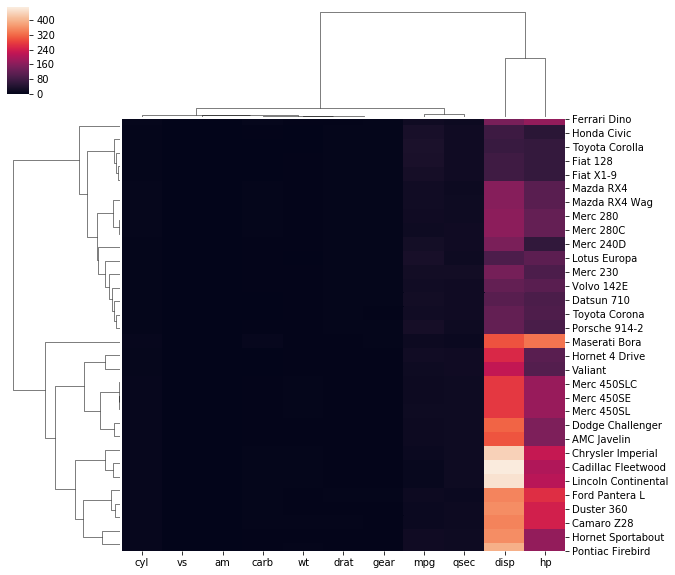

In [22]:
# Libraries
import seaborn as sns
import pandas as pd
from matplotlib import pyplot as plt
 
# Data set
url = 'https://python-graph-gallery.com/wp-content/uploads/mtcars.csv'
df = pd.read_csv(url)
df = df.set_index('model')
del df.index.name
df
 
# Default plot
sns.clustermap(df)

In [23]:
import pandas as pd

import dash_core_components as dcc
import dash_bio as dashbio


df = pd.read_csv('https://raw.githubusercontent.com/plotly/dash-bio-docs-files/master/clustergram_mtcars.tsv',
                 sep='	', skiprows=4).set_index('model')

columns = list(df.columns.values)
rows = list(df.index)

clustergram = dashbio.Clustergram(
    data=df.loc[rows].values,
    row_labels=rows,
    column_labels=columns,
    color_threshold={
        'row': 250,
        'col': 700
    },
    height=800,
    width=700,
    color_map= [
        [0.0, '#636EFA'],
        [0.25, '#AB63FA'],
        [0.5, '#FFFFFF'],
        [0.75, '#E763FA'],
        [1.0, '#EF553B']
    ]
)

dcc.Graph(figure=clustergram) 
clustergram.show()
print(clustergram)

C:\Users\ben\Anaconda3\lib\site-packages\plotly\tools.py:465: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



Figure({
    'data': [{'hoverinfo': 'y+name',
              'line': {'width': 0.5},
              'marker': {'color': 'rgb(0,0,0)'},
              'mode': 'lines',
              'name': 'Col Cluster 0',
              'type': 'scatter',
              'x': array([ 25.,  25., 100., 100.,  nan]),
              'xaxis': 'x2',
              'y': array([ 115.84951446, 1475.10429123, 1475.10429123,  656.64044195,
                                    nan]),
              'yaxis': 'y2'},
             {'hoverinfo': 'y+name',
              'line': {'width': 0.5},
              'marker': {'color': 'rgb(0,0,255)'},
              'mode': 'lines',
              'name': 'Col Cluster 1',
              'type': 'scatter',
              'x': array([ 5.,  5., 15., 15., nan, 35., 35., 45., 45., nan, 55., 55., 65., 65.,
                          nan, 75., 75., 85., 85., nan, 60., 60., 80., 80., nan, 40., 40., 70.,
                          70., nan, 25., 25., 55., 55., nan, 10., 10., 40., 40., nan]),
         

,COVID_49,COVID_99,COVID_27,COVID_77,COVID_55,COVID_46,COVID_38,COVID_71,COVID_08,COVID_57,...,COVID_80,COVID_75,COVID_98,COVID_102,COVID_84,COVID_52,COVID_74,COVID_41,COVID_02,COVID_87
P24821-4,4.138617,9.394954,2.126676,3.212577,-0.128531,-1.911568,-1.376005,-0.928474,-0.773813,1.793737,...,4.540277,4.684489,6.400454,7.902899,6.065889,-2.878133,6.976529,6.712197,5.665361,6.510758
Q71DI3,7.317308,-0.102282,-1.738060,8.145028,7.593072,5.617665,-0.368182,-0.204161,-2.719114,-2.805416,...,0.082893,0.675673,-0.859535,-2.865811,-0.063508,-1.556571,3.949446,3.262460,4.318808,0.144460
Q99497,5.719916,8.552794,-0.425357,6.312970,5.226545,5.686718,5.346991,4.823572,6.129522,0.224950,...,0.604432,-2.229337,-1.520658,-2.990216,-0.869824,-0.493663,3.711249,-1.557202,-2.503541,-4.541536
P01877,7.088971,-1.847865,-4.129268,-3.769222,-2.940619,-3.763935,6.674672,-4.380907,-1.504955,-5.945127,...,-0.924530,-2.883341,-0.617794,-2.710542,-3.657562,4.319200,6.599778,9.655296,-5.103174,-5.332592
O75874,7.589175,9.627468,5.865765,2.124866,5.288964,-1.461987,2.590633,0.256543,5.797214,-1.742238,...,5.452348,6.249416,-0.673945,-0.297914,-0.772429,-0.421890,-1.930120,-2.224013,2.015192,5.052717
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
A0A0J9YY99,3.146877,-1.565208,-3.687992,0.647593,-1.686238,-2.404075,2.017263,-1.835490,-1.447346,-1.293630,...,-1.322478,2.274981,-1.362063,0.444852,-1.888745,1.404943,3.189056,1.917198,-2.125471,-1.910558
P0DP08,3.401023,1.076531,-1.282414,-0.937911,-2.798433,0.898746,2.833960,-0.605110,-2.305410,-3.299876,...,-3.998315,-2.710407,-0.249995,-0.105833,-4.144029,-2.079024,-1.539466,2.328244,1.468709,0.914028
A0A0B4J2H0,-1.168045,-0.121272,-0.207637,-1.087051,-3.525862,-1.353194,1.207187,-1.181829,-0.546572,-1.033159,...,-0.009726,-4.354265,0.212192,1.826374,1.285321,0.026809,1.863400,1.495718,2.619678,1.959348
H7BXV5,-0.104889,0.703783,1.878985,-2.028187,-5.358854,0.429967,1.084992,-0.024995,1.515090,2.184642,...,1.720444,2.198739,2.318083,-1.113954,1.659772,2.114996,0.233222,2.071413,-0.694702,1.892127


In [120]:
import pandas as pd

import dash_core_components as dcc
import dash_bio as dashbio


df = pd.read_csv('https://raw.githubusercontent.com/plotly/dash-bio-docs-files/master/clustergram_mtcars.tsv',
                 sep='	', skiprows=4).set_index('model')

columns = list(df.columns.values)
rows = list(df.index)

clustergram = dashbio.Clustergram(
    data=df.loc[rows].values,
    row_labels=rows,
    column_labels=columns,
    color_threshold={
        'row': 250,
        'col': 700
    },
    height=800,
    width=700,
    hidden_labels='row',
    col_group_marker=[
        {'group': 5, 'annotation': 'largest column cluster', 'color': '#EF553B'}
    ],
    row_group_marker=[
        {'group': 2, 'annotation': 'cluster 2', 'color': '#AB63FA'},
        {'group': 1, 'annotation': '', 'color': '#19D3F3'}
    ]
)

clustergram.show()  
print(clustergram)


Figure({
    'data': [{'hoverinfo': 'y+name',
              'line': {'width': 0.5},
              'marker': {'color': 'rgb(0,0,0)'},
              'mode': 'lines',
              'name': 'Col Cluster 0',
              'type': 'scatter',
              'x': array([ 25.,  25., 100., 100.,  nan]),
              'xaxis': 'x2',
              'y': array([ 115.84951446, 1475.10429123, 1475.10429123,  656.64044195,
                                    nan]),
              'yaxis': 'y2'},
             {'hoverinfo': 'y+name',
              'line': {'width': 0.5},
              'marker': {'color': 'rgb(0,0,255)'},
              'mode': 'lines',
              'name': 'Col Cluster 1',
              'type': 'scatter',
              'x': array([ 5.,  5., 15., 15., nan, 35., 35., 45., 45., nan, 55., 55., 65., 65.,
                          nan, 75., 75., 85., 85., nan, 60., 60., 80., 80., nan, 40., 40., 70.,
                          70., nan, 25., 25., 55., 55., nan, 10., 10., 40., 40., nan]),
         

In [121]:
df

,mpg,cyl,disp,hp,drat,wt,qsec,vs,am,gear,carb
model,,,,,,,,,,,
Mazda RX4,21.0,6,160.0,110,3.90,2.620,16.46,0,1,4,4
Mazda RX4 Wag,21.0,6,160.0,110,3.90,2.875,17.02,0,1,4,4
Datsun 710,22.8,4,108.0,93,3.85,2.320,18.61,1,1,4,1
Hornet 4 Drive,21.4,6,258.0,110,3.08,3.215,19.44,1,0,3,1
Hornet Sportabout,18.7,8,360.0,175,3.15,3.440,17.02,0,0,3,2
Valiant,18.1,6,225.0,105,2.76,3.460,20.22,1,0,3,1
Duster 360,14.3,8,360.0,245,3.21,3.570,15.84,0,0,3,4
Merc 240D,24.4,4,146.7,62,3.69,3.190,20.00,1,0,4,2
Merc 230,22.8,4,140.8,95,3.92,3.150,22.90,1,0,4,2
